# Fusion d'images


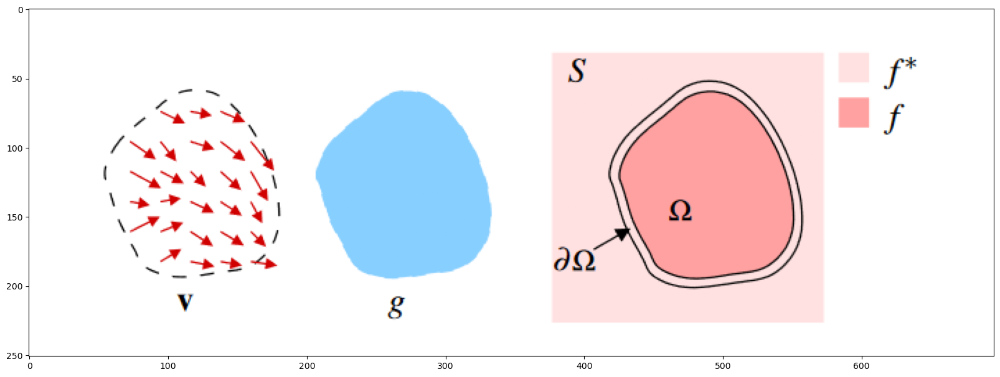

In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

img = mpimg.imread("./img/guided_interp.PNG")
plt.rcParams["figure.figsize"] = [20.0, 15.0]
plt.imshow(img)
plt.show()

We work on the minimization problem:
\begin{equation}
   \min_{u}\int  \left\lVert \nabla u - v \right\rVert^2, u_{\Omega-D}  = T^*_{\Omega-D}
\end{equation}
where $T^*$ is the target/destination image. We chose to write the constraint as :
\begin{equation*}
    u \in K = \{z : z_{\Omega^c}=target_{\Omega^c}\}
\end{equation*}
The initial problem (1) can therefore be re-written as:
\begin{equation}
    \min_{u} J(u) = \int_{\Omega} \left\lVert \nabla u - v \right\rVert^2 + \iota_{K}(u)
\end{equation}
The indicator function being non differentiable, we need to use a Forward backward method in order to obtain a solution. An iteration of the Forward backward algorithm is given by:
\begin{equation*}
    x_{n+1} = prox_g(x_n - \gamma \nabla f(x_n))
\end{equation*}
In our case the proximal operator is nothing but the orthogonal projection on $K$

In [3]:
import numpy as np
import scipy as scp
import pylab as pyl
import numpy.linalg as npl
#import pywt
import pandas as pd
import matplotlib.pyplot as plt
import requests
#from panel.pane import LaTeX
#hv.extension('bokeh')
import warnings
#warnings.filterwarnings('ignore')
from PIL import Image
#from io import BytesIO
from random import randint
from matplotlib.pyplot import figure

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from scipy import ndimage as ndi
from skimage.util import random_noise
from skimage import feature
import cv2 as cv


/usr/local/insa/anaconda/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [4]:
target=np.array(Image.open("./img/target_Boat.png")).astype(float)
source=np.array(Image.open("./img/source_Kraken.png")).astype(float)
mask2=np.array(Image.open("./img/mask_Kraken.png")).astype(float)/255

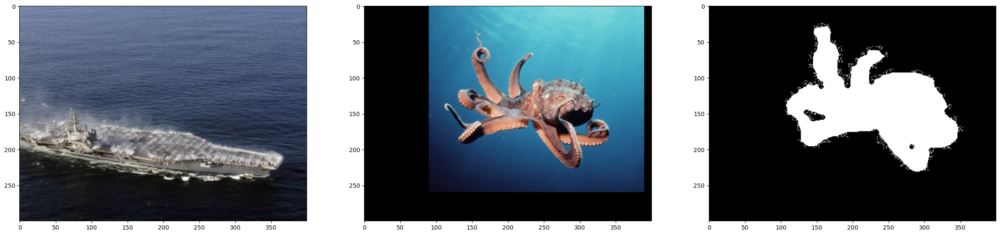

In [5]:
plt.rcParams["figure.figsize"] = (30,30)
f, (ax1, ax2,ax3) = plt.subplots(1,3)
ax1.imshow(target/255)
ax2.imshow(source/255)
ax3.imshow(mask2,cmap="gray")

In [ ]:
def GradientHor(x):
    y=x-np.roll(x,1,axis=1)
    y[:,0]=0
    return y
def GradientVer(x):
    y=x-np.roll(x,1,axis=0)
    y[0,:]=0
    return y
def DivHor(x):
    N=len(x[0])
    y=x-np.roll(x,-1,axis=1)
    y[:,0]=-x[:,1]
    y[:,N-1]=x[:,N-1]
    return y
def DivVer(x):
    N=len(x)
    y=x-np.roll(x,-1,axis=0)
    y[0,:]=-x[1,:]
    y[N-1,:]=x[N-1,:]
    return y
def Gradient(x):
    y=[]
    y.append(GradientHor(x))
    y.append(GradientVer(x))
    return y
def Div(y):
    x=DivHor(y[0])+DivVer(y[1])
    return x

def Proj(im,ma,iref):
    res = np.copy(iref) 
    mask = np.where(ma==1)
    res[mask]=im[mask]
    return res

def GradientFonc(x,y):
    res = Div(np.array(Gradient(x))-np.array(y))
    return res

In [ ]:
#target = bateau
#source = poulpe

target0=target[:,:,0]
source0=source[:,:,0]
target1=target[:,:,1]
source1=source[:,:,1]
target2=target[:,:,2]
source2=source[:,:,2]

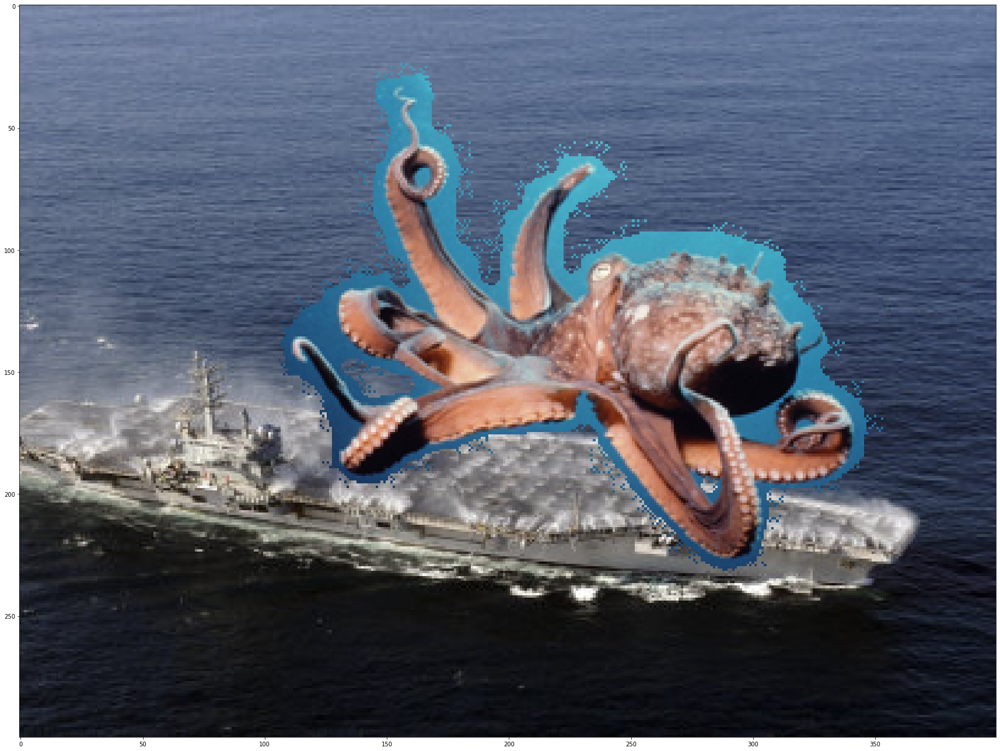

In [ ]:
plt.imshow(Proj(source,mask2,target)/255)

In [ ]:
import numpy.linalg as npl

def FBPoissonEditing(targ,sour,ma,step,Niter,y):
    #targ=bateau
    #sour=poulpe
    f=[]
    x = np.zeros(np.shape(targ))
    for n in range(Niter):
        x = Proj(x - step * GradientFonc(x,y), ma, iref= targ)
        f += [npl.Dans cette partie, on cherche à recréer une image avec une texture aplani (flatenned).

L'idée est de ne conserver les informations de gradient que là où il y a un bord net,c'est à dire des traits particulier du visage, et d'annuler le gradient partout ailleurs. De cette façon, seuls les bords les plus nets seront transférés dans la nouvelle image.
Image initiale(x,0,255),f[:]

In [ ]:
def FISTAPoissonEditing(targ,sour,ma,step,alpha,Niter,y):
    x=np.copy(targ)
    mask=np.where(ma==1)
    x[mask]=sour[mask]
    f=[]
    x1 = x
    for i in range(0,Niter):
        x_tilde = x+i/(i+alpha)*(x-x1)
        x1 = x_tilde
        x = Proj(x_tilde - step * GradientFonc(x_tilde,y),ma,targ)
        f+=[npl.norm((np.array(Gradient(x))- y))**2]

    f=np.array(f)    
    return np.clip(x,0,255),f[10:]

## Seamless Cloning

### Importing gradients : $v = \nabla{s} $

In [ ]:
# Vecteur y  = grad(s)

y0 = np.array(Gradient(source0))
y1 = np.array(Gradient(source1))
y2 = np.array(Gradient(source2))

In [ ]:
n=1000
im0,f0=FBPoissonEditing(targ=target0,sour=source0,ma=mask2,step=0.12,Niter=n,y=y0)
im1,f1=FBPoissonEditing(targ=target1,sour=source1,ma=mask2,step=0.12,Niter=n,y=y1)
im2,f2=FBPoissonEditing(targ=target2,sour=source2,ma=mask2,step=0.12,Niter=n,y=y2)

In [ ]:
im0,f0=FISTAPoissonEditing(target0,source0,mask2,step=0.1,alpha=4,Niter=1000,y=y0)
im1,f1=FISTAPoissonEditing(target1,source1,mask2,step=0.1,alpha=4,Niter=1000,y=y1)
im2,f2=FISTAPoissonEditing(target2,source2,mask2,step=0.1,alpha=4,Niter=1000,y=y2)

In [ ]:
im = np.copy(source)
im[:,:,0] = im0
im[:,:,1] = im1
im[:,:,2] = im2

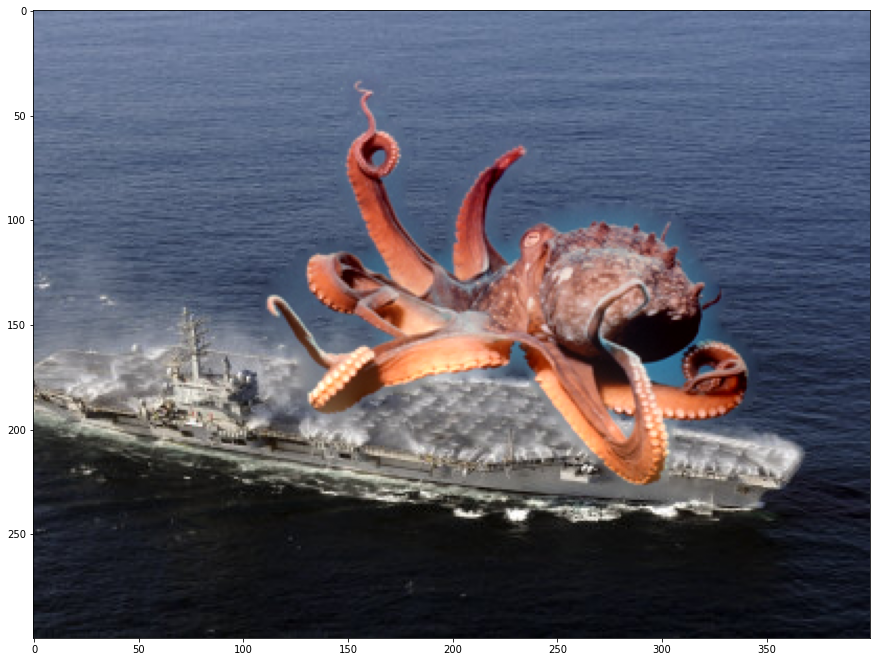

In [ ]:
test=np.array([im0.T,im1.T,im2.T]).astype('uint8')
plt.figure(figsize=(15,20))
plt.imshow(im/255)

### Mixing gradients
Dans cette partie, on compare le gradient des deux images et de on conserve les pixels dont la variation est la plus forte . Ainsi, on conserve les pixels de l'image source s'ils varient plus que ceux de l'image cible, ou inversement. Ceci est traduit : 

$$
v = \left\{
    \begin{array}{ll}
        \nabla{t} & \mbox{si } |\nabla{t}|>|\nabla{s}| \\
        \nabla{s} & \mbox{sinon}
    \end{array}
\right.
$$

Cela mène à une effet de transparence entre l'image source et l'image cible. 

In [ ]:

def _mixing_gradient(target, source):
    #Compute the gradient of target 
    grad_target = np.array(Gradient(target))
    #Compute the norm of the gradient 
    norm_target = np.sqrt(grad_target[0]**2 + grad_target[1]**2)# this gives a matrix = [norm(u,v)]_ij 
    w = grad_target

    grad_source = np.array(Gradient(source))
    norm_source = np.sqrt(grad_source[0]**2 + grad_source[1]**2) # this gives a matrix = [norm(u,v)]_ij 
    v = grad_source

    targ_sup_sour = norm_target > norm_source 

    for i in range(np.shape(grad_source)[1]): 
        for j in range(np.shape(grad_source)[2]):
            if targ_sup_sour[i,j]:
                v[:,i,j] = grad_target[:,i,j]
            
    return v

y0 = _mixing_gradient(target0, source0)
y1 = _mixing_gradient(target1, source1)
y2 = _mixing_gradient(target2, source2)

In [ ]:
x0,f0=FISTAPoissonEditing(target0,source0,mask2,step=0.1,alpha=4,Niter=500,y=y0)
x1,f1=FISTAPoissonEditing(target1,source1,mask2,step=0.1,alpha=4,Niter=500,y=y1)
x2,f2=FISTAPoissonEditing(target2,source2,mask2,step=0.1,alpha=4,Niter=500,y=y2)
x=np.zeros_like(target)
x[:,:,0]=x0
x[:,:,1]=x1
x[:,:,2]=x2

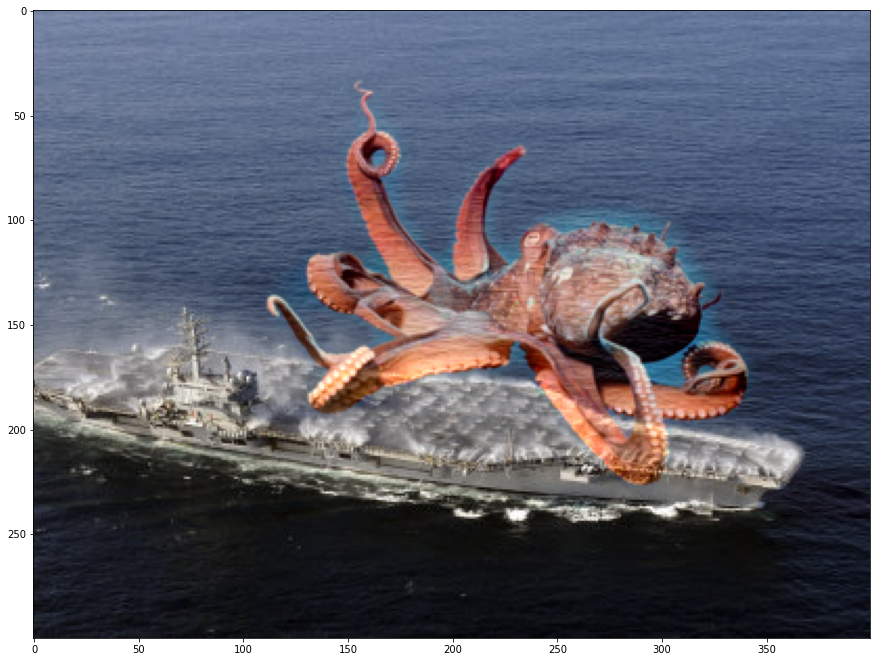

In [ ]:
test=np.array([x0.T,x1.T,x2.T]).astype('uint8')
plt.figure(figsize=(15,20))
plt.imshow(test.transpose())

In [ ]:
tower=np.array(Image.open("./img/landscape2.jpg")).astype(float)
arc=np.array(Image.open("./img/arc.png")).astype(float)
mask3=np.array(Image.open("./img/mask.png")).astype(float)/255

In [ ]:
mask3 = mask3==1


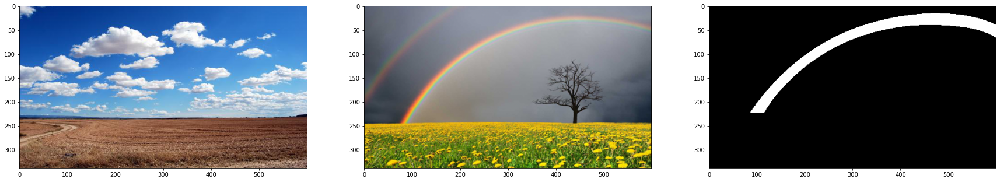

In [ ]:
plt.rcParams["figure.figsize"] = (30,30)
f, (ax1, ax2,ax3) = plt.subplots(1,3)
ax1.imshow(tower/255)
ax2.imshow(arc/255)
ax3.imshow(mask3,cmap="gray")

In [ ]:
tower0=tower[:,:,0]
arc0=arc[:,:,0]
tower1=tower[:,:,1]
arc1=arc[:,:,1]
tower2=tower[:,:,2]
arc2=arc[:,:,2]

In [ ]:
y0 = _mixing_gradient(tower0, arc0)
y1 = _mixing_gradient(tower1, arc1)
y2 = _mixing_gradient(tower2, arc2)

In [ ]:
x0,f0=FISTAPoissonEditing(tower0,arc0,mask3,step=0.1,alpha=4,Niter=1000,y=y0)
x1,f1=FISTAPoissonEditing(tower1,arc1,mask3,step=0.1,alpha=4,Niter=1000,y=y1)
x2,f2=FISTAPoissonEditing(tower2,arc2,mask3,step=0.1,alpha=4,Niter=1000,y=y2)
x=np.zeros_like(tower)
x[:,:,0]=x0
x[:,:,1]=x1
x[:,:,2]=x2

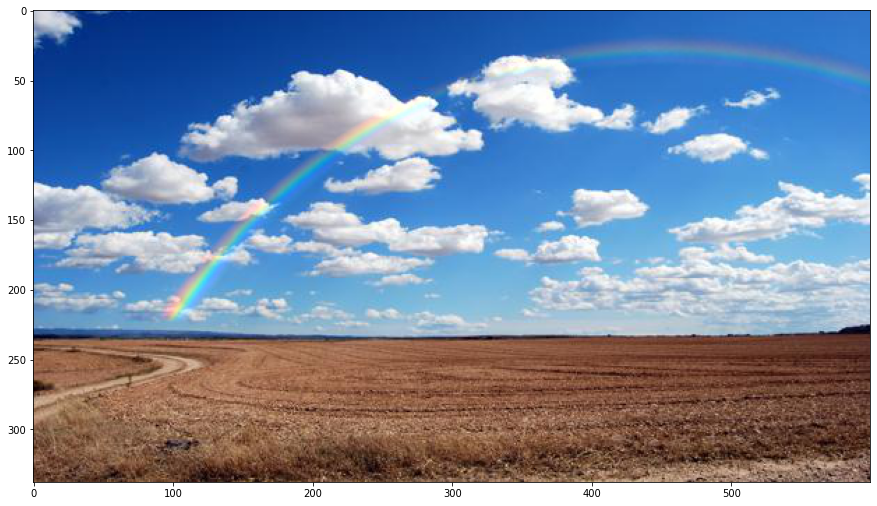

In [ ]:
test=np.array([x0.T,x1.T,x2.T]).astype('uint8')
plt.figure(figsize=(15,20))
plt.imshow(test.transpose())

## Selection Editing

### Texture flattening

Dans cette partie, on cherche à recréer une image avec une texture aplani (flatenned).

L'idée est de ne conserver les informations de gradient que là où il y a un bord net,c'est à dire des traits particulier du visage, et d'annuler le gradient partout ailleurs. De cette façon, seuls les bords les plus nets seront transférés dans la nouvelle image.

# Image initiale

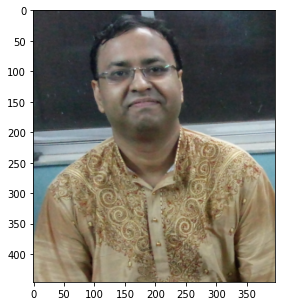

In [ ]:
homme=np.array(Image.open("./img/me2.png")).astype(float)
plt.figure(figsize = (50,5))
plt.imshow(homme/255)


In [ ]:
# séparation des couleurs
homme_c1=homme[:,:,0]
homme_c2=homme[:,:,1]
homme_c3=homme[:,:,2]
c1 = np.uint8(homme_c1)
c2 = np.uint8(homme_c2)
c3 = np.uint8(homme_c3)

L'algorithme de détection de bord Canny est composé de 5 étapes:

- Réduction de bruit
- Calcul de gradient
- Suppression non maximale
- Double seuil
- Suivi des bords par hystérésis

(Text(0.5, 1.0, 'Edge Image'),
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

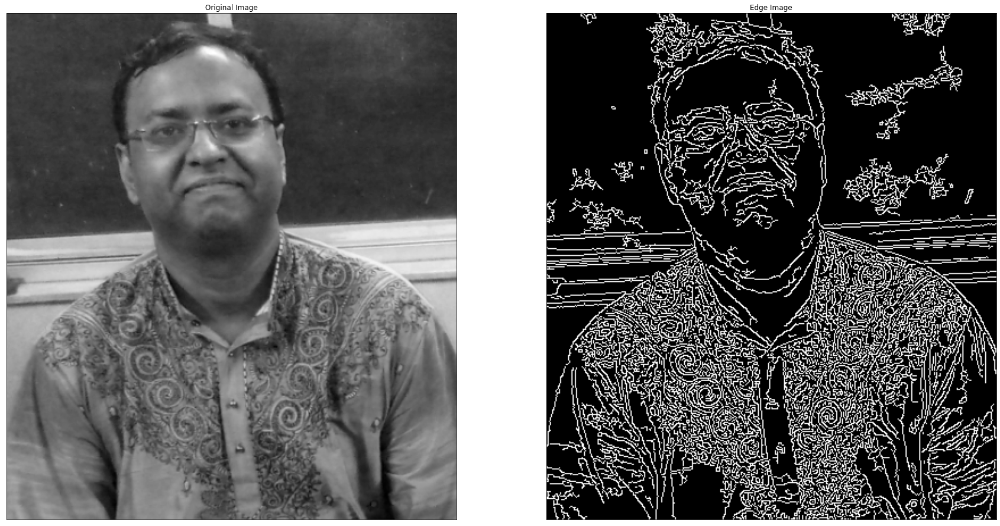

In [ ]:
# Edge detector
canny1= cv.Canny(c1,5,80)/255
canny2= cv.Canny(c2,5,80)/255
canny3= cv.Canny(c3,5,80)/255
useful
plt.subplot(121),plt.imshow(homme_c3,cmap = 'gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(canny1,cmap = 'gray')
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])

In [ ]:
#Méthode d'interet
def grad(x,mask):
    grad = np.array(Gradient(x))
    return (mask *grad)


In [ ]:
# Application de la méthode à notre image
grad_1 = grad(homme_c1,canny1*(2))
grad_2 = grad(homme_c2,canny2*(2))
grad_3 = grad(homme_c3,canny3*(2))

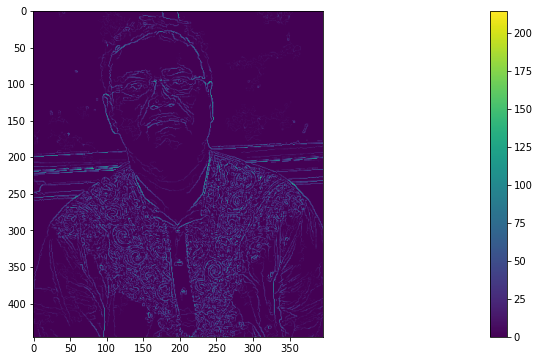

In [ ]:
plt.figure(figsize = (60,6))
plt.imshow(np.sqrt(grad_1[0]**2+grad_1[1]**2)) #expression de la norme
plt.colorbar()

In [ ]:
# Masque pour choisir le visage et le cou
#entre 100 et 250 pour l'axe des x et 45 et 290 pour l'axe des y 
mask_homme = np.zeros((373, 287))
mask_homme[100:250,45:290] = 1

In [ ]:
# Application de l'algorithme FISTA
im_homme_1,f0=FISTAPoissonEditing(homme_c1,homme_c1,mask_homme,step=0.1,alpha=4,Niter=200,y=grad_1)
im_homme_2,f1=FISTAPoissonEditing(homme_c2,homme_c2,mask_homme,step=0.1,alpha=4,Niter=200,y=grad_2)
im_homme_3,f2=FISTAPoissonEditing(homme_c3,homme_c3,mask_homme,step=0.1,alpha=4,Niter=200,y=grad_3)

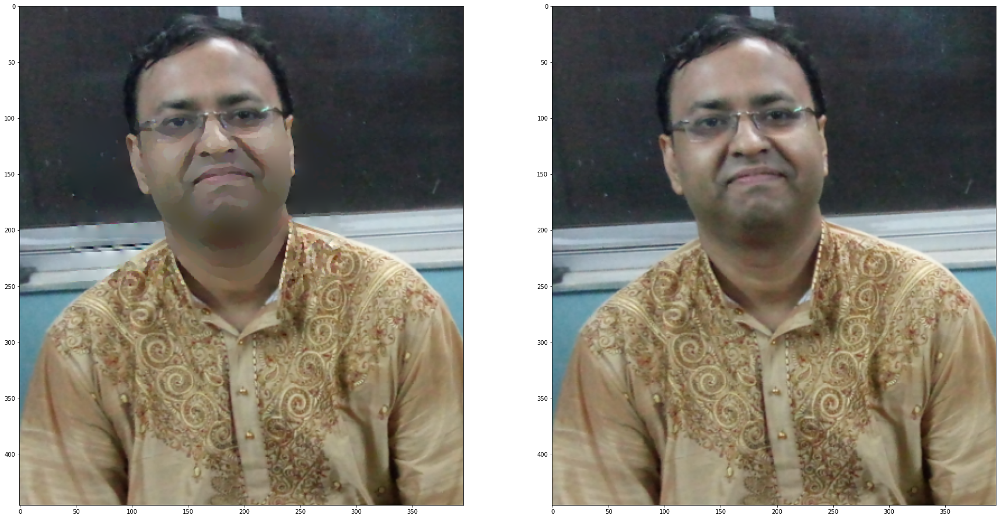

In [ ]:
test=np.array([im_homme_1.T,im_homme_2.T,im_homme_3.T]).astype('uint8')
f,(ax1, ax2) = plt.subplots(1,2)
ax1.imshow(test.transpose())
ax2.imshow(homme/255)

### Local illumination changes

Le champ v cette fois-ci est:
\begin{equation*}
    v = \alpha^\beta |\nabla f*|^{-\beta} |\nabla f^*|
\end{equation*}

In [ ]:
def y_4eMethode(x,alpha,beta):
    grad = np.array(Gradient(x))
    norm_grad = np.sqrt(grad[0]**2+grad[1]**2)
    norm_grad_beta = np.zeros_like(norm_grad)
    norm_grad_beta[norm_grad>0] = norm_grad[norm_grad>0]**(-beta)
    moyenne_norm_grad = np.mean(norm_grad)
    return(alpha*moyenne_norm_grad)**beta * norm_grad_beta * grad

In [ ]:
beta = 0.5
alphas = [1,100,500]

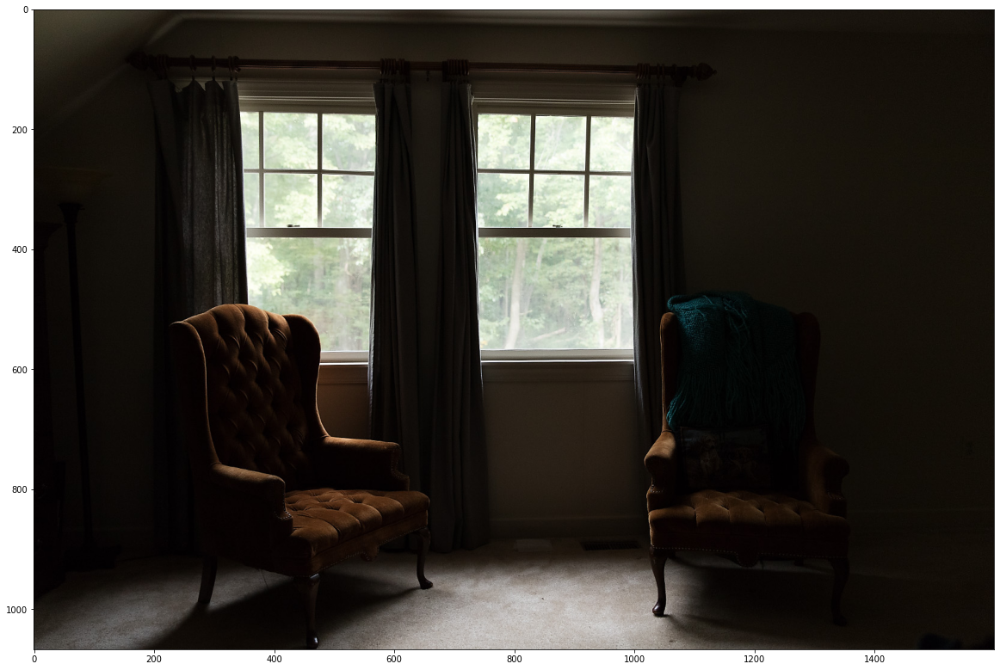

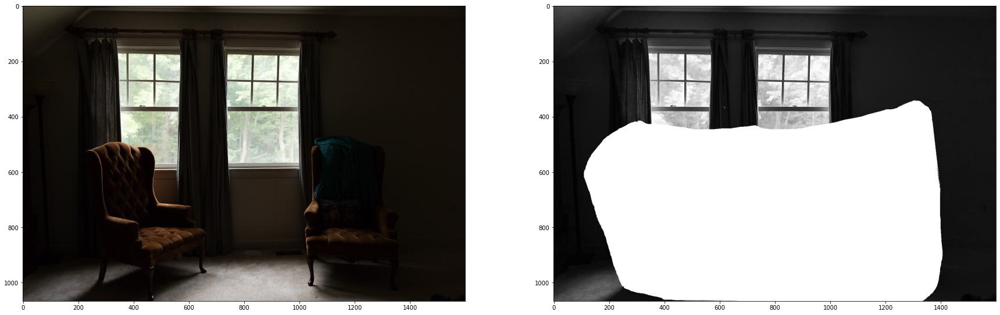

In [ ]:
fauteuil = mpimg.imread("./img/fauteuil.jpg")

plt.rcParams["figure.figsize"] = [20.0, 15.0]
plt.imshow(fauteuil)
plt.show()

mask_fauteuil = mpimg.imread("./img/mask_fauteuil.jpg")

mask_fauteuil=np.array(mask_fauteuil).astype(float)[:,:,0]/255
#_, mask_fauteuil = cv2.threshold(mask_fauteuil, 128, 255, cv2.THRESH_BINARY)

fauteuil = np.array(fauteuil).astype(float)un

#print(mask_musee.shape)

plt.rcParams["figure.figsize"] = (30,30)
f, (ax1, ax2) = plt.subplots(1,2)
ax1.imshow(fauteuil/255)
ax2.imshow(mask_fauteuil,cmap="gray")un

fauteuil0 = fauteuil[:,:,0]
fauteuil1 = fauteuil[:,:,1]
fauteuil2 = fauteuil[:,:,2]


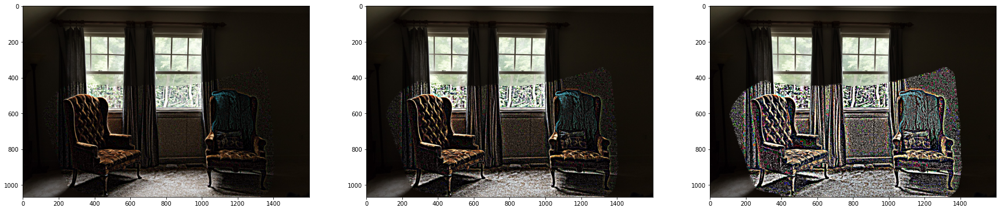

In [ ]:
fig, ax = plt.subplots(1,3, figsize=(30,10))
for i in range(3):
    alpha = alphas[i]

    y0 = y_4eMethode(fauteuil0, alpha, beta)
    y1 = y_4eMethode(fauteuil1, alpha, beta)
    y2 = y_4eMethode(fauteuil2, alpha, beta)

    x0,f0=FISTAPoissonEditing(fauteuil0,fauteuil0,mask_fauteuil,step=0.1,alpha=4,Niter=100,y=y0)
    x1,f1=FISTAPoissonEditing(fauteuil1,fauteuil1,mask_fauteuil,step=0.1,alpha=4,Niter=100,y=y1)
    x2,f2=FISTAPoissonEditing(fauteuil2,fauteuil2,mask_fauteuil,step=0.1,alpha=4,Niter=100,y=y2)

    im_new=np.array([x0.T,x1.T,x2.T]).astype('uint8')

    
    ax[i].imshow(im_new.T)

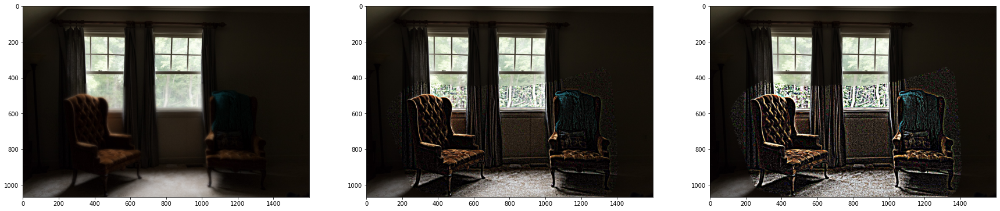

In [ ]:
fig, ax = plt.subplots(1,3, figsize=(30,10))
for i in range(3):
    alpha = alphas[i]

    y0 = y_4eMethode(fauteuil0, alpha, beta)
    y1 = y_4eMethode(fauteuil1, alpha, beta)
    y2 = y_4eMethode(fauteuil2, alpha, beta)

    x0,f0=FISTAPoissonEditing(fauteuil0,fauteuil0,mask_fauteuil,step=0.1,alpha=4,Niter=100,y=y0)
    x1,f1=FISTAPoissonEditing(fauteuil1,fauteuil1,mask_fauteuil,step=0.1,alpha=4,Niter=100,y=y1)
    x2,f2=FISTAPoissonEditing(fauteuil2,fauteuil2,mask_fauteuil,step=0.1,alpha=4,Niter=100,y=y2)

    im_new=np.array([x0.T,x1.T,x2.T]).astype('uint8')

    
    ax[i].imshow(im_new.T)

In [ ]:
mask_fauteuil2 = mpimg.imread("./img/mask_fauteuil2.jpg")

mask_fauteuil2=np.array(mask_fauteuil2).astype(float)[:,:,0]/255

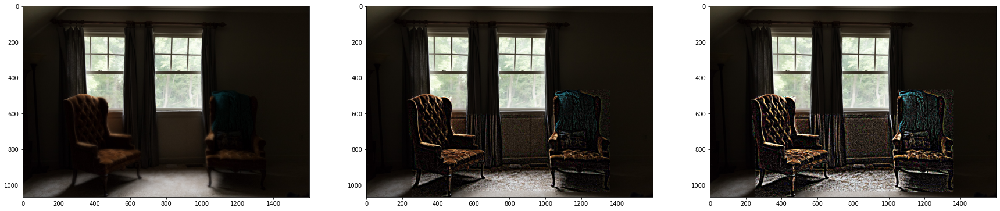

In [ ]:
fig, ax = plt.subplots(1,3, figsize=(30,10))
for i in range(3):
    alpha = alphas[i]

    y0 = y_4eMethode(fauteuil0, alpha, beta)
    y1 = y_4eMethode(fauteuil1, alpha, beta)
    y2 = y_4eMethode(fauteuil2, alpha, beta)

    x0,f0=FISTAPoissonEditing(fauteuil0,fauteuil0,mask_fauteuil2,step=0.1,alpha=4,Niter=100,y=y0)
    x1,f1=FISTAPoissonEditing(fauteuil1,fauteuil1,mask_fauteuil2,step=0.1,alpha=4,Niter=100,y=y1)
    x2,f2=FISTAPoissonEditing(fauteuil2,fauteuil2,mask_fauteuil2,step=0.1,alpha=4,Niter=100,y=y2)

    im_new=np.array([x0.T,x1.T,x2.T]).astype('uint8')

    
    ax[i].imshow(im_new.T)

## Contrast Enhancement

L'objectif de cette partie est de comparer les valeurs du gradient et essayer de les pondérer par rapport à la valeur moyenne de la norme des gradients.
Deux paramètres sont essentiels à cette opération: \\
-alpha: (>0) représente un seuil sur lequel on va se baser pour décider d'augmenter ou diminuer le gradient.  \
-$\beta$: (> 0 ) définit la portée/force de l'amplification. 

$v = \big(\alpha \frac{moy(|\nabla{t}|)}{|\nabla{t}|} \big)^{\beta}\nabla{t}$,   où v la guidance field,  $\beta>0$ on atteint le seuil d'amplification lorsque $\alpha \frac{moy(|\nabla{t}|)}{|\nabla{t}|} > 1$ => $|\nabla{t}| < \alpha . moy(|\nabla{t}|)$

In [ ]:
def hausse_contraste(x,mask, alpha = 0.2, beta=-0.5):
    grad = np.array(Gradient(x))
    norm_grad = np.sqrt(grad[0]**2 + grad[1]**2)

    beta_norm_grad = np.zeros_like(norm_grad)
    beta_norm_grad[norm_grad>0] = norm_grad[norm_grad>0]**(-beta)

    moy_norm_grad = np.mean(norm_grad)
    nonzero_grad = 1 * (norm_grad > 0)
    return (alpha * moy_norm_grad)**beta * beta_norm_grad * grad

In [ ]:
source=np.array(Image.open("./img/source_Kraken.png")).astype(float)
mask2=np.array(Image.open("./img/mask_Kraken.png")).astype(float)/255

In [ ]:
poulpe = source[0:250,100:370]
mask = mask2[0:250,100:370]

poulpe0=poulpe[:,:,0]
poulpe1=poulpe[:,:,1]
poulpe2=poulpe[:,:,2]

y0 = np.array(Gradient(poulpe0))

### Images initiales

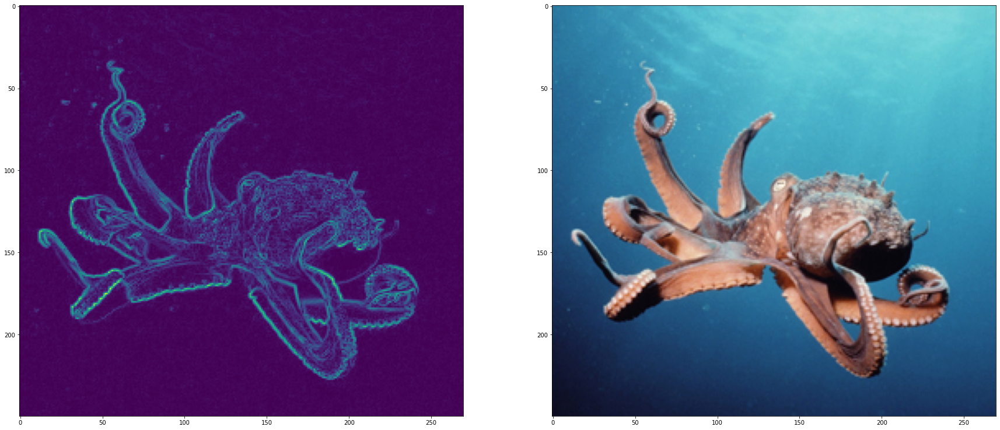

In [ ]:
fig, ax = plt.subplots(1,2)
ax[0].imshow(np.sqrt(y0[0]**2+y0[1]**2))
ax[1].imshow(poulpe.astype('int'))

### 1) $\beta$  est positif(=1)  $ et$ $\alpha$ = [0.1, 3, 20]


L'amplification est grande pour $\alpha \frac{moy(|\nabla{t}|)}{|\nabla{t}|} \gg 1$ =>$|\nabla{t}| \ll \alpha . moy(|\nabla{t}|)$

In [ ]:
beta = 1
alphas = [0.1,3,20]

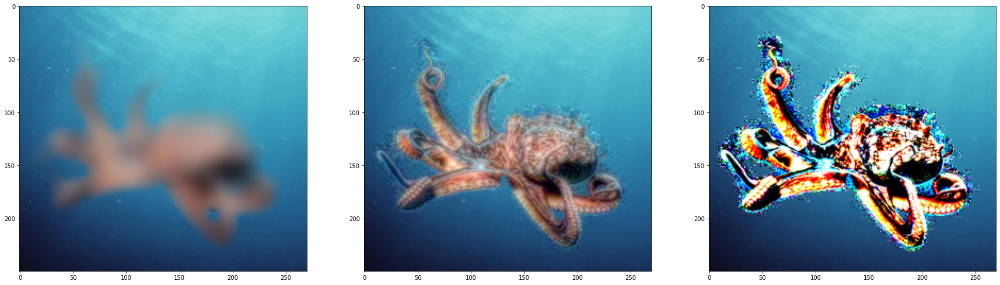

In [ ]:
fig, ax = plt.subplots(1,3, figsize=(30,10))
for i in range(3):
    alpha = alphas[i]

    y0 = hausse_contraste(poulpe0,mask, alpha, beta)
    y1 = hausse_contraste(poulpe1,mask, alpha, beta)
    y2 = hausse_contraste(poulpe2,mask, alpha, beta)

    x0,f0=FISTAPoissonEditing(poulpe0,poulpe0,mask,step=0.1,alpha=4,Niter=200,y=y0)
    x1,f1=FISTAPoissonEditing(poulpe1,poulpe1,mask,step=0.1,alpha=4,Niter=200,y=y1)
    x2,f2=FISTAPoissonEditing(poulpe2,poulpe2,mask,step=0.1,alpha=4,Niter=200,y=y2)

    im_new=np.array([x0.T,x1.T,x2.T]).astype('uint8')

    
    ax[i].imshow(im_new.T)



### 2) $\beta$  est négatif(= -1)  $ et$ $\alpha$ = [0.1, 5, 50]


L'amplification est grande pour $\alpha \frac{moy(|\nabla{t}|)}{|\nabla{t}|} \approx 0$ =>$|\nabla{t}| \gg \alpha . moy(|\nabla{t}|)$
    

In [ ]:
beta = -1
alphas = [0.1,5,50]

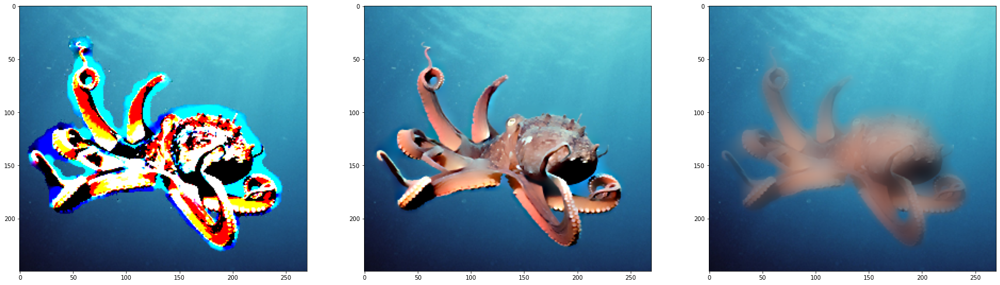

In [ ]:
fig, ax = plt.subplots(1,3, figsize=(30,10))
for i in range(3):
    alpha = alphas[i]

    y0 = hausse_contraste(poulpe0,mask, alpha, beta)
    y1 = hausse_contraste(poulpe1,mask, alpha, beta)
    y2 = hausse_contraste(poulpe2,mask, alpha, beta)

    x0,f0=FISTAPoissonEditing(poulpe0,poulpe0,mask,step=0.1,alpha=4,Niter=200,y=y0)
    x1,f1=FISTAPoissonEditing(poulpe1,poulpe1,mask,step=0.1,alpha=4,Niter=200,y=y1)
    x2,f2=FISTAPoissonEditing(poulpe2,poulpe2,mask,step=0.1,alpha=4,Niter=200,y=y2)

    im_new=np.array([x0.T,x1.T,x2.T]).astype('uint8')

    
    ax[i].imshow(im_new.T)

### 3) Dashboard

In [ ]:
import holoviews as hv
import param
import panel as pn
pn.extension()
hv.extension('bokeh')

In [ ]:
poulpe = source[0:250,100:370]
mask = mask2[0:250,100:370]

poulpe0=poulpe[:,:,0]
poulpe1=poulpe[:,:,1]
poulpe2=poulpe[:,:,2]

In [ ]:
class ShowContrast(param.Parameterized):

    alpha = param.Number(0.2,bounds=(0,5))
    beta = param.Number(0.0,bounds=(-1,1))
    def view(self):
        y0 = hausse_contraste(poulpe0,mask, alpha = self.alpha, beta = self.beta)
        y1 = hausse_contraste(poulpe1,mask, alpha = self.alpha, beta = self.beta)
        y2 = hausse_contraste(poulpe2,mask, alpha = self.alpha, beta = self.beta)

        x0,f0=FISTAPoissonEditing(poulpe0,poulpe0,mask,step=0.1,alpha=4,Niter=150,y=y0)
        x1,f1=FISTAPoissonEditing(poulpe1,poulpe1,mask,step=0.1,alpha=4,Niter=150,y=y1)
        x2,f2=FISTAPoissonEditing(poulpe2,poulpe2,mask,step=0.1,alpha=4,Niter=150,y=y2)

        im = np.stack((poulpe0,poulpe1,poulpe2), axis=2).astype('uint8')
        im_new = np.stack((x0,x1,x2), axis=2).astype('uint8')
        return pn.Row(hv.RGB(im), hv.RGB(im_new))

In [ ]:
show_contrast = ShowContrast()
pn.Row(show_contrast.param,show_contrast.view)
#0.2  -0.1

Row
    [0] Column(margin=5, name='ShowContrast', width=300)
        [0] StaticText(value='<b>ShowContrast</b>')
        [1] FloatSlider(end=5, name='Alpha', value=0.2)
        [2] FloatSlider(name='Beta', start=-1)
    [1] ParamMethod(method)